### 
1.Breast Cancer Classification

2.The aim is to try to predict whether the cancer cell is benign or malignant

In [132]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score,recall_score,f1_score

In [133]:
df = pd.read_csv(r"C:\Users\acer\Desktop\mydocument\ML\csv files\Breast Cancer Wisconsi\Breast Cancer data.csv")

In [3]:
df

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


# EDA
"""Exploratory Data Analysis (EDA) is the very first step before you can perform any changes to the dataset or develop a statistical model to answer business problems. In other words, the process of EDA contains summarizing, visualizing and getting deeply acquainted with the important traits of a data set. You should have noticed that the phrase “Exploratory” contained in the name itself should have the reason, right?

Typically, using EDA we try to get the answer to the following questions:

What kind of data is this? (file format, volume of data, number of columns, metadata data of image/video/audio or some feedback in English or other languages, or tabular data, etc)

How complex is this data? (How many files are there? primary key? how these files are connected to each other? is nested data in some files? is some field having nested data, etc.)

Is this data sufficient for meeting our ultimate goal, i.e. Model building?

Is there any missing data? Data needed but not given by the business or not available at all or costly to get that data etc.

Are there any missing values? In the given dataset do we have complete information or some values are missing for some records or some columns?

Is there any relationship between different independent variables of the dataset? If yes then how strong is that relationship?

Are observations independent or tightly coupled?"""

### Check shape of data

In [4]:
df.shape

(569, 33)

### check all column name 

In [5]:
print(df.columns)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')


### Check  information aboout dataset

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

### 
We have 33 variables and 596 observations in the dataset, also;

We have 1 String variables. (diagnosis)

We have 32 numerical variables. (id, radius_mean, texture_mean, perimeter_mean, area_mean, smoothness_mean, compactness_mean, concavity_mean,concave points_mean, symmetry_mean, fractal_dimension_mean, radius_se, texture_se, perimeter_se, area_se, smoothness_se, compactness_se, concavity_se, concave points_se, symmetry_se, fractal_dimension_se, radius_worst, texture_worst, perimeter_worst, area_worst, smoothness_worst, compactness_worst, concavity_worst, concave points_worst, symmetry_worst, fractal_dimension_worst, Unnamed: 32)

### Checking duplicate value

In [7]:
df.duplicated().sum()

0

In [8]:
# Checking Null Value
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [9]:
# checking null value in percentage
df.isnull().sum()/df.shape[0]*100

id                           0.0
diagnosis                    0.0
radius_mean                  0.0
texture_mean                 0.0
perimeter_mean               0.0
area_mean                    0.0
smoothness_mean              0.0
compactness_mean             0.0
concavity_mean               0.0
concave points_mean          0.0
symmetry_mean                0.0
fractal_dimension_mean       0.0
radius_se                    0.0
texture_se                   0.0
perimeter_se                 0.0
area_se                      0.0
smoothness_se                0.0
compactness_se               0.0
concavity_se                 0.0
concave points_se            0.0
symmetry_se                  0.0
fractal_dimension_se         0.0
radius_worst                 0.0
texture_worst                0.0
perimeter_worst              0.0
area_worst                   0.0
smoothness_worst             0.0
compactness_worst            0.0
concavity_worst              0.0
concave points_worst         0.0
symmetry_w

### Unnamed feature having maximum number of null value, so we need to drop this feature 

In [10]:
df = df.drop('Unnamed: 32',axis = 1)

D:\python\app\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='diagnosis', ylabel='count'>

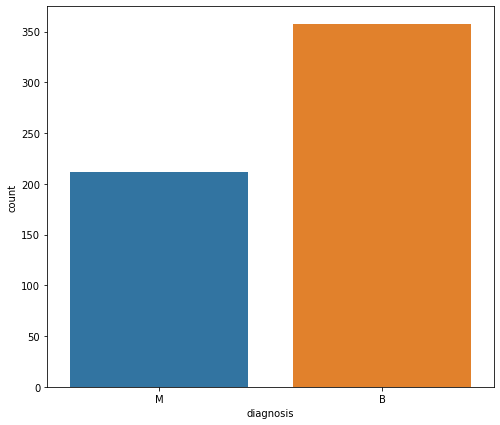

In [11]:
# count plot for diagnosis
plt.figure(figsize=(8,7))
sns.countplot(df['diagnosis'])

In [12]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [13]:
print(df['diagnosis'].value_counts()/df.shape[0]*100)

B    62.741652
M    37.258348
Name: diagnosis, dtype: float64


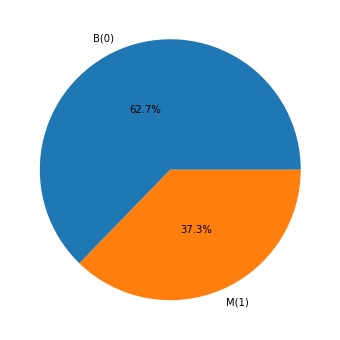

In [14]:
diagnosis= df['diagnosis'].value_counts().values
plt.figure(figsize=(7, 6))
plt.pie(diagnosis,labels=['B(0)', 'M(1)'], autopct='%1.1f%%', pctdistance=0.5)
plt.show()

### 
count of M(malignant) = 212 , 37%  and count of  B(benign) = 357,62%

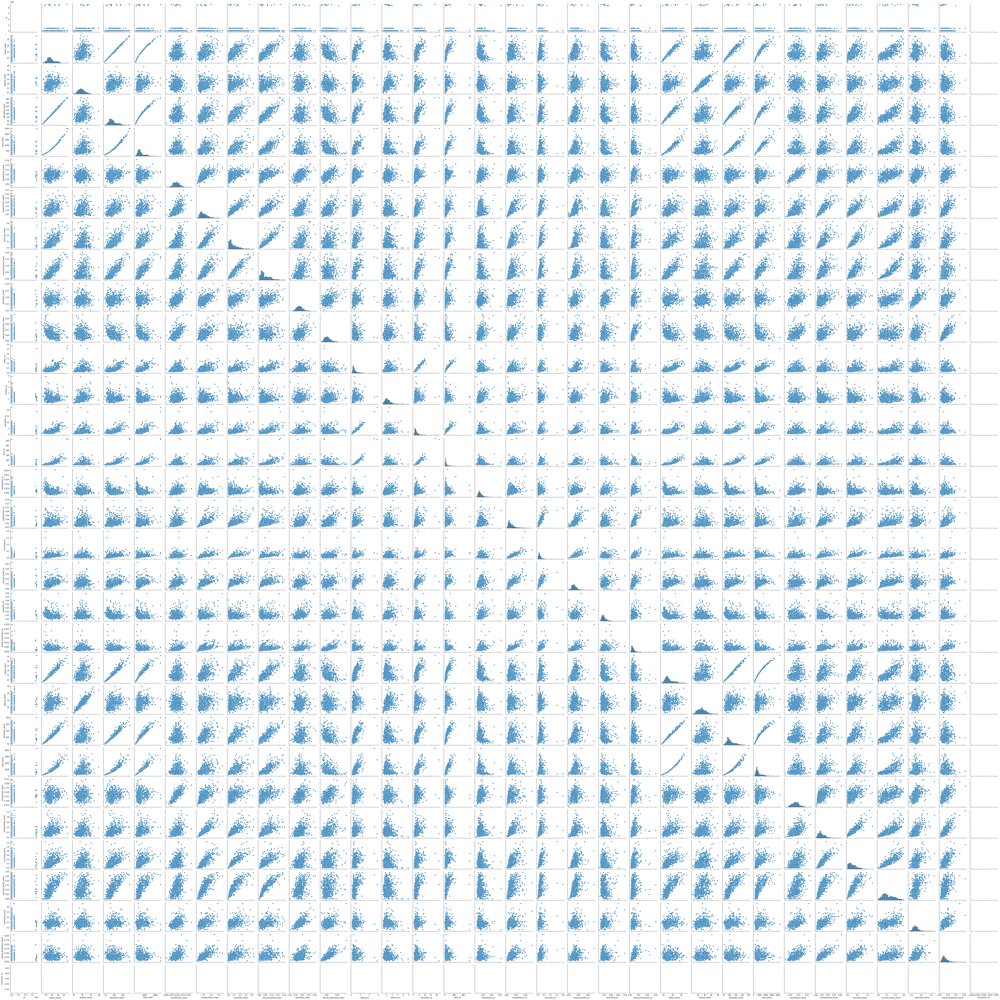

In [134]:
sns.pairplot(df)

D:\python\app\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='radius_mean', ylabel='Density'>

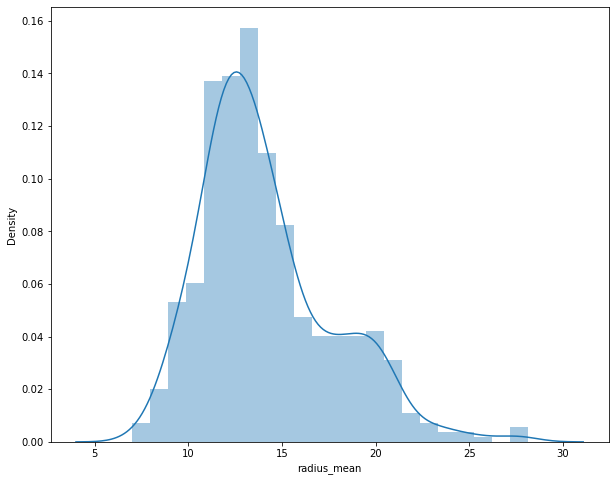

In [15]:
plt.figure(figsize=(10,8))
sns.distplot(df['radius_mean'],kde = True)

### 
Replacing M with 1 and B with 0

In [16]:
df['diagnosis'].replace({"M":1,"B":0},inplace=True)

In [17]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [18]:
X = df.drop('diagnosis',axis = 1)
y = df['diagnosis']

### 
droping unwanted features

In [19]:
to_drop = ['perimeter_mean','radius_mean','compactness_mean','concave points_mean','radius_se','perimeter_se','radius_worst','perimeter_worst','compactness_worst','concave points_worst','compactness_se','concave points_se','texture_worst','area_worst']

In [20]:
X.drop(to_drop,axis = True,inplace=True)

In [21]:
X

,id,texture_mean,area_mean,smoothness_mean,concavity_mean,symmetry_mean,fractal_dimension_mean,texture_se,area_se,smoothness_se,concavity_se,symmetry_se,fractal_dimension_se,smoothness_worst,concavity_worst,symmetry_worst,fractal_dimension_worst
0,842302,10.38,1001.0,0.11840,0.30010,0.2419,0.07871,0.9053,153.40,0.006399,0.05373,0.03003,0.006193,0.16220,0.7119,0.4601,0.11890
1,842517,17.77,1326.0,0.08474,0.08690,0.1812,0.05667,0.7339,74.08,0.005225,0.01860,0.01389,0.003532,0.12380,0.2416,0.2750,0.08902
2,84300903,21.25,1203.0,0.10960,0.19740,0.2069,0.05999,0.7869,94.03,0.006150,0.03832,0.02250,0.004571,0.14440,0.4504,0.3613,0.08758
3,84348301,20.38,386.1,0.14250,0.24140,0.2597,0.09744,1.1560,27.23,0.009110,0.05661,0.05963,0.009208,0.20980,0.6869,0.6638,0.17300
4,84358402,14.34,1297.0,0.10030,0.19800,0.1809,0.05883,0.7813,94.44,0.011490,0.05688,0.01756,0.005115,0.13740,0.4000,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,22.39,1479.0,0.11100,0.24390,0.1726,0.05623,1.2560,158.70,0.010300,0.05198,0.01114,0.004239,0.14100,0.4107,0.2060,0.07115
565,926682,28.25,1261.0,0.09780,0.14400,0.1752,0.05533,2.4630,99.04,0.005769,0.03950,0.01898,0.002498,0.11660,0.3215,0.2572,0.06637
566,926954,28.08,858.1,0.08455,0.09251,0.1590,0.05648,1.0750,48.55,0.005903,0.04730,0.01318,0.003892,0.11390,0.3403,0.2218,0.07820
567,927241,29.33,1265.0,0.11780,0.35140,0.2397,0.07016,1.5950,86.22,0.006522,0.07117,0.02324,0.006185,0.16500,0.9387,0.4087,0.12400


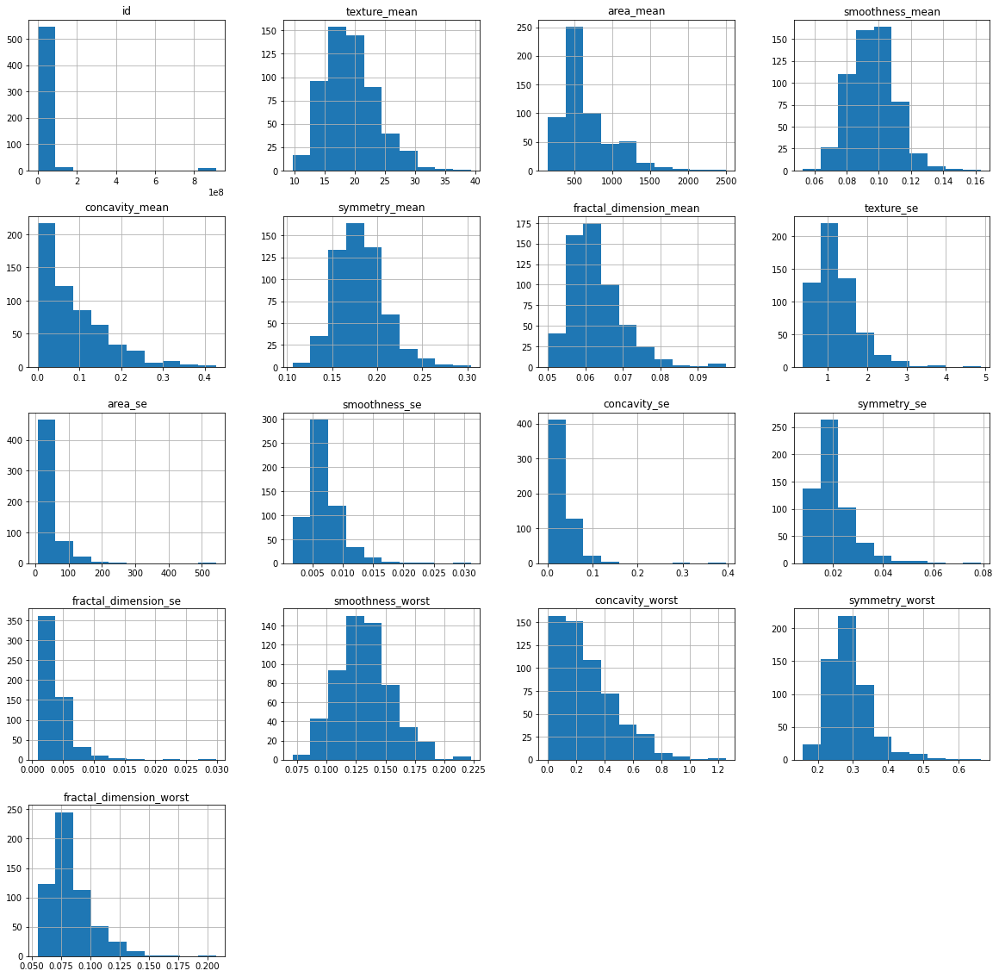

In [22]:
#histogram on dataframe

X.hist(figsize=(20,20))
plt.show()

<AxesSubplot:>

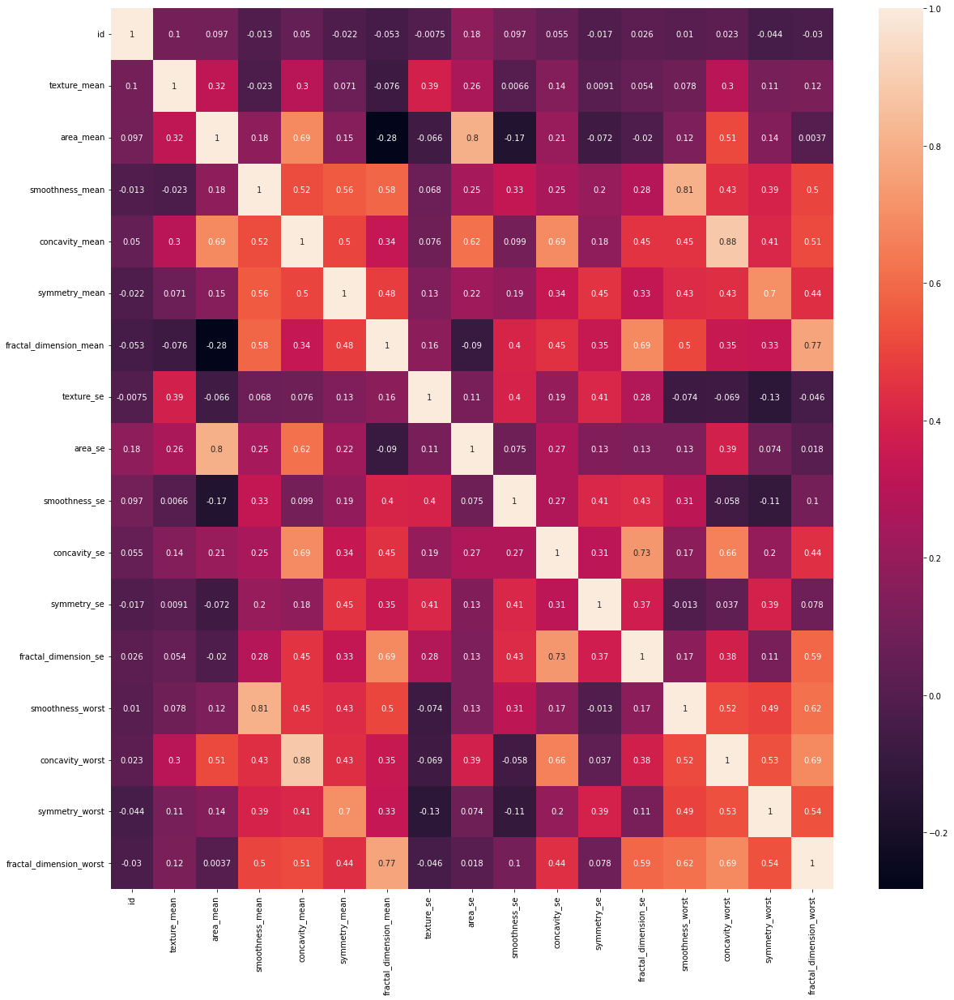

In [23]:
#Correlation matrix:
plt.figure(figsize=(20,20))
sns.heatmap(X.corr(),annot=True)

In [24]:
X.columns

Index(['id', 'texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean',
       'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se',
       'smoothness_se', 'concavity_se', 'symmetry_se', 'fractal_dimension_se',
       'smoothness_worst', 'concavity_worst', 'symmetry_worst',
       'fractal_dimension_worst'],
      dtype='object')

In [25]:
column_to_analyse = ['id', 'texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean',
       'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se',
       'smoothness_se', 'concavity_se', 'symmetry_se', 'fractal_dimension_se',
       'smoothness_worst', 'concavity_worst', 'symmetry_worst',
       'fractal_dimension_worst']

###  Finding outliers

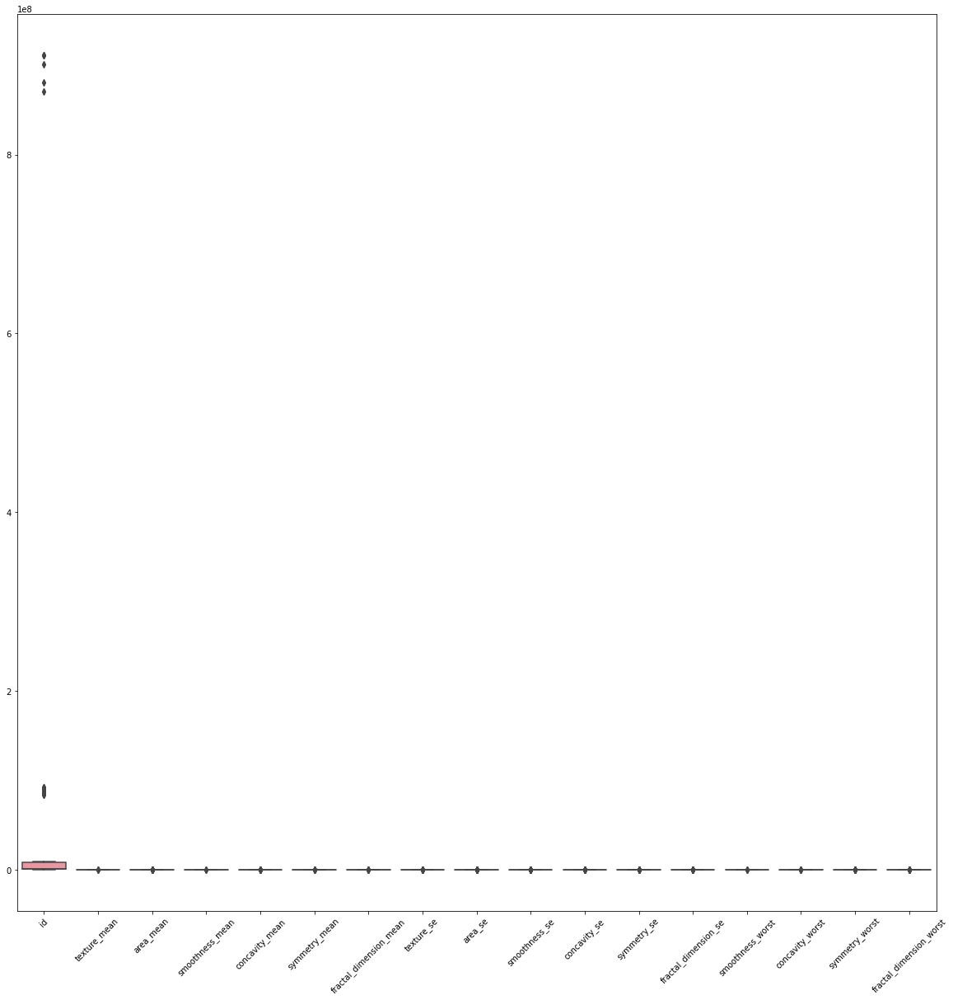

In [26]:
plt.figure(figsize=(20, 20))
sns.boxplot(data=X[column_to_analyse])
plt.xticks(rotation=45)
plt.show()

In [27]:
# these features are having outliers
['id', 'texture_mean', 'area_mean', 'smoothness_mean', 'concavity_mean',
       'symmetry_mean', 'fractal_dimension_mean', 'texture_se', 'area_se',
       'smoothness_se', 'concavity_se', 'symmetry_se', 'fractal_dimension_se',
       'smoothness_worst', 'concavity_worst', 'symmetry_worst',
       'fractal_dimension_worst'],

(['id',
  'texture_mean',
  'area_mean',
  'smoothness_mean',
  'concavity_mean',
  'symmetry_mean',
  'fractal_dimension_mean',
  'texture_se',
  'area_se',
  'smoothness_se',
  'concavity_se',
  'symmetry_se',
  'fractal_dimension_se',
  'smoothness_worst',
  'concavity_worst',
  'symmetry_worst',
  'fractal_dimension_worst'],)

### Removing outliers from data

In [28]:
X['id'] = X['id'].clip(lower=X['id'].quantile(0.25),upper=X['id'].quantile(0.75))

X['texture_mean'] = X['texture_mean'].clip(lower=X['texture_mean'].quantile(0.25)
                                           ,upper=X['texture_mean'].quantile(0.75))

X['area_mean'] = X['area_mean'].clip(lower=X['area_mean'].quantile(0.25)
                                     ,upper=X['area_mean'].quantile(0.75))

X['smoothness_mean'] = X['smoothness_mean'].clip(lower=X['smoothness_mean'].quantile(0.25)
                                                 ,upper=X['smoothness_mean'].quantile(0.75))

X['concavity_mean'] = X['concavity_mean'].clip(lower=X['concavity_mean'].quantile(0.25)
                                               ,upper=X['concavity_mean'].quantile(0.75))

X['symmetry_mean'] = X['symmetry_mean'].clip(lower=X['symmetry_mean'].quantile(0.25)
                                             ,upper=X['symmetry_mean'].quantile(0.75))

X['fractal_dimension_mean'] = X['fractal_dimension_mean'].clip(lower=X['fractal_dimension_mean'].quantile(0.25)
                                                               ,upper=X['fractal_dimension_mean'].quantile(0.75))

X['texture_se'] = X['texture_se'].clip(lower=X['texture_se'].quantile(0.25)
                                       ,upper=X['texture_se'].quantile(0.75))

X['area_se'] = X['area_se'].clip(lower=X['area_se'].quantile(0.25)
                                 ,upper=X['area_se'].quantile(0.75))

X['smoothness_se'] = X['smoothness_se'].clip(lower=X['smoothness_se'].quantile(0.25)
                                             ,upper=X['smoothness_se'].quantile(0.75))

X['concavity_se'] = X['concavity_se'].clip(lower=X['concavity_se'].quantile(0.25)
                                           ,upper=X['concavity_se'].quantile(0.75))

X['symmetry_se'] = X['symmetry_se'].clip(lower=X['symmetry_se'].quantile(0.25)
                                         ,upper=X['symmetry_se'].quantile(0.75))

X['fractal_dimension_se'] = X['fractal_dimension_se'].clip(lower=X['fractal_dimension_se'].quantile(0.25)
                                                           ,upper=X['fractal_dimension_se'].quantile(0.75))

X['smoothness_worst'] = X['smoothness_worst'].clip(lower=X['smoothness_worst'].quantile(0.25)
                                                   ,upper=X['smoothness_worst'].quantile(0.75))

X['concavity_worst'] = X['concavity_worst'].clip(lower=X['concavity_worst'].quantile(0.25)
                                                 ,upper=X['concavity_worst'].quantile(0.75))

X['symmetry_worst'] = X['symmetry_worst'].clip(lower=X['symmetry_worst'].quantile(0.25)
                                               ,upper=X['symmetry_worst'].quantile(0.75))

X['fractal_dimension_worst'] = X['fractal_dimension_worst'].clip(lower=X['fractal_dimension_worst'].quantile(0.25)
                                                                 ,upper=X['fractal_dimension_worst'].quantile(0.75))


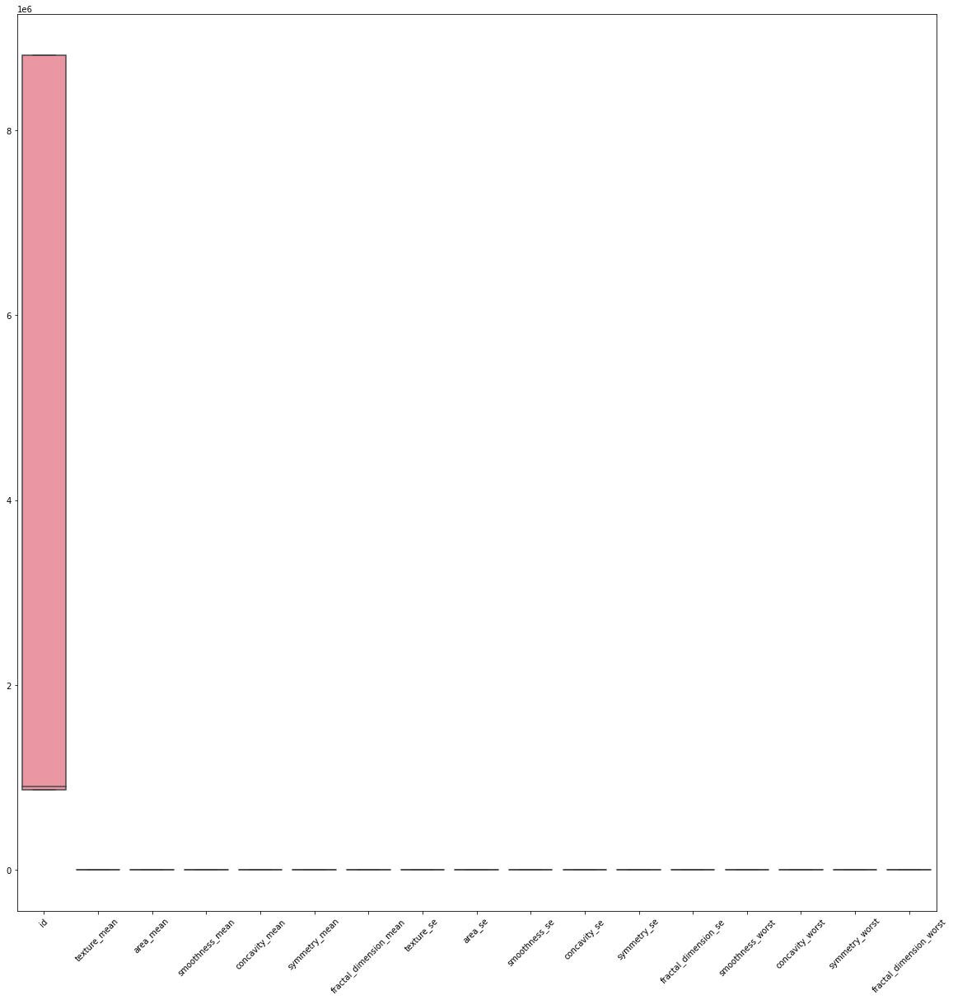

In [29]:
plt.figure(figsize=(20, 20))
sns.boxplot(data=X[column_to_analyse])
plt.xticks(rotation=45)
plt.show()

In [30]:
y

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

### sampling

In [31]:
from imblearn.over_sampling import SMOTE
X_res,y_res = SMOTE().fit_resample(X,y)

In [32]:
y_res.value_counts()

1    357
0    357
Name: diagnosis, dtype: int64

### train test split

In [33]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_res , y_res, test_size=0.2,random_state=42)

### scaling

In [34]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [35]:
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [ ]:
from sklearn.matrics import confusion_matrix
cm = confusion_matrix

##  model evaluation 

### DecisionTree

In [81]:
from sklearn.tree import DecisionTreeClassifier
DSC= DecisionTreeClassifier(criterion='entropy',max_depth=3)

In [82]:
DSC.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3)

In [83]:
y_pred2 = DSC.predict(X_test)

In [84]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score

In [85]:
accuracy_score(y_pred2,y_test)

0.9020979020979021

In [86]:
precision_score(y_test,y_pred2,average='macro')

0.9038461538461539

In [87]:
recall_score(y_test,y_pred2,average='macro')

0.9009988249118683

In [88]:
from sklearn import tree

[Text(0.5, 0.875, 'X[4] <= -0.253\nentropy = 1.0\nsamples = 571\nvalue = [288, 283]'),
 Text(0.25, 0.625, 'X[2] <= -0.301\nentropy = 0.404\nsamples = 261\nvalue = [240, 21]'),
 Text(0.125, 0.375, 'X[8] <= 1.245\nentropy = 0.046\nsamples = 195\nvalue = [194, 1]'),
 Text(0.0625, 0.125, 'entropy = 0.0\nsamples = 192\nvalue = [192, 0]'),
 Text(0.1875, 0.125, 'entropy = 0.918\nsamples = 3\nvalue = [2, 1]'),
 Text(0.375, 0.375, 'X[1] <= -0.259\nentropy = 0.885\nsamples = 66\nvalue = [46, 20]'),
 Text(0.3125, 0.125, 'entropy = 0.0\nsamples = 34\nvalue = [34, 0]'),
 Text(0.4375, 0.125, 'entropy = 0.954\nsamples = 32\nvalue = [12, 20]'),
 Text(0.75, 0.625, 'X[2] <= 0.601\nentropy = 0.622\nsamples = 310\nvalue = [48, 262]'),
 Text(0.625, 0.375, 'X[13] <= 0.195\nentropy = 0.974\nsamples = 116\nvalue = [47, 69]'),
 Text(0.5625, 0.125, 'entropy = 0.503\nsamples = 36\nvalue = [32, 4]'),
 Text(0.6875, 0.125, 'entropy = 0.696\nsamples = 80\nvalue = [15, 65]'),
 Text(0.875, 0.375, 'X[8] <= -0.944\nentr

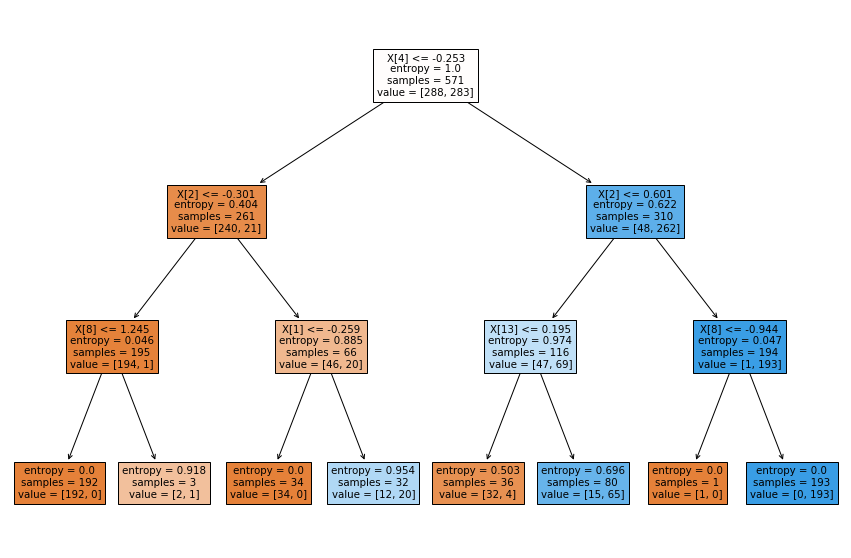

In [89]:
plt.figure(figsize=(15,10))
tree.plot_tree(DSC,filled=True)

### Preprunning

In [90]:
parameter={
    'criterion':['gini','entropy','log_loss'],
    'splitter':['best','random'],
    'max_depth':[1,2,3,4,5],
    'max_features':['auto','sqrt','log2']
}

In [91]:
from sklearn.model_selection import GridSearchCV

In [92]:
DSC = DecisionTreeClassifier(max_depth=2)
cv = GridSearchCV(DSC,param_grid=parameter,cv=5,scoring='accuracy')

In [93]:
cv.fit(X_train,y_train)

D:\python\app\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
150 fits failed out of a total of 450.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "D:\python\app\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "D:\python\app\lib\site-packages\sklearn\tree\_classes.py", line 937, in fit
    super().fit(
  File "D:\python\app\lib\site-packages\sklearn\tree\_classes.py", line 352, in fit
    criterion = CRITERIA_CLF[self.criterion](
KeyError: 'log_loss'

  warnings.warn(some_fits_failed_message, FitFailedWarning)
D:\python\app\li

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(max_depth=2),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [94]:
cv.best_params_

{'criterion': 'gini',
 'max_depth': 5,
 'max_features': 'sqrt',
 'splitter': 'best'}

In [95]:
y_pred2 = cv.predict(X_test)

In [96]:
dt_score = accuracy_score(y_test,y_pred2)

In [97]:
dt_score

0.8741258741258742

In [119]:
precision_score(y_test,y_pred2,average='macro')

0.9651799687010955

In [120]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred2)

In [121]:
cm

array([[68,  1],
       [ 4, 70]], dtype=int64)

### Random forest classifier

In [122]:
from sklearn.ensemble import RandomForestClassifier

In [123]:
rf = RandomForestClassifier()

In [124]:
rf.fit(X_train,y_train)

RandomForestClassifier()

In [125]:
y_pred3 = rf.predict(X_test)

In [126]:
Rt_Score = accuracy_score(y_test,y_pred3)

In [127]:
Rt_Score

0.972027972027972

In [128]:
precision_score(y_test,y_pred3)

0.9861111111111112

In [129]:
recall_score(y_test,y_pred3)

0.9594594594594594

In [130]:
from sklearn.metrics import confusion_matrix
cm1 = confusion_matrix(y_test,y_pred3)

In [131]:
cm1

array([[68,  1],
       [ 3, 71]], dtype=int64)

### from above data we can say Random forest classifier has good accuracy then Decision tree models